In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import gsw
import numpy as np
from mpl_toolkits.basemap import Basemap

In [2]:
# Get data into dataframe
df = pd.read_csv('../../../WMA_fractions_v2.csv', skiprows=1)

# Preprocess data to only have temperature, salinity and dissolved oxygen
df_ST = df.copy()
df_ST = df_ST[['Conservative_Temperature_[deg_C]', 'Absolute_Salinity_[PSU]', 'Dissolved_Oxygen_[micro_mol_per_kg]', 'Depth_[m]', 'Latitude_[deg_N]', 'Longitude_[deg_E]','Datetime_[UTC]']]
df_ST['year'] = pd.to_datetime(df_ST['Datetime_[UTC]']).dt.year
df_ST['month'] = pd.to_datetime(df_ST['Datetime_[UTC]']).dt.month
df_ST = df_ST[['Conservative_Temperature_[deg_C]', 'Absolute_Salinity_[PSU]', 'Dissolved_Oxygen_[micro_mol_per_kg]', 'Depth_[m]', 'Latitude_[deg_N]', 'Longitude_[deg_E]','year', 'month']]

In [3]:
# Break into two parts (1980-2000 and 2000-2023)
df_80_00 = df_ST[(df_ST['year'] >= 1980) & (df_ST['year'] < 2000)]
df_00_23 = df_ST[(df_ST['year'] >= 2000) & (df_ST['year'] < 2023)]

In [4]:
# Minimum or average flag
flag = False # If True then True for minimum and False for average
# If False then False for minimum and True for average

# Method 1 - lat lon bins of equal area (uniform lon and uniform sin lat) sample geographically

In [5]:
# Sample bins uniformly (geographically)
def sample_bins(df, n_lon_bins=72, n_lat_bins=9, min_flag=True):
    # Define area of interest (Arctic Ocean)
    lon_min, lon_max = -180, 180
    lat_min, lat_max = 45, 90

    # Equal-area bins: uniform in longitude, uniform in sin(latitude)
    lon_bins = np.linspace(lon_min, lon_max, n_lon_bins + 1)
    sin_min = np.sin(np.radians(lat_min))
    sin_max = np.sin(np.radians(lat_max))
    sin_bins = np.linspace(sin_min, sin_max, n_lat_bins + 1)
    lat_bins = np.degrees(np.arcsin(sin_bins))

    # Assign each point to a bin
    df['lon_bin'] = pd.cut(df['Longitude_[deg_E]'], bins=lon_bins, labels=False, include_lowest=True)
    df['lat_bin'] = pd.cut(df['Latitude_[deg_N]'], bins=lat_bins, labels=False, include_lowest=True)    
    
    # Find bin with least data points and sample that many points from each bin
    if min_flag:
        min_count = df.groupby(['lon_bin', 'lat_bin']).size().min()
        sampled_df = df.groupby(['lon_bin', 'lat_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)
    else:
        avg_count = df.groupby(['lon_bin', 'lat_bin']).size().mean().round().astype(int)
        sampled_df = (df.groupby(['lon_bin', 'lat_bin'], group_keys=False).apply(lambda g: g.sample(n=min(len(g), avg_count), random_state=22)).reset_index(drop=True))
    return sampled_df


In [6]:
df_sampled = sample_bins(df_ST, n_lon_bins=144, n_lat_bins=18, min_flag=flag)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24966/719582531.py:24: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = (df.groupby(['lon_bin', 'lat_bin'], group_keys=False).apply(lambda g: g.sample(n=min(len(g), avg_count), random_state=22)).reset_index(drop=True))


In [7]:
def plot_heatmap(ds_cleaned, n_lon_bins=72, n_lat_bins=9, bin_max=None):
    lon_min, lon_max = -180, 180
    lat_min, lat_max = 45, 90
    resolution = 'l'

    # Equal-area bins: uniform in longitude, uniform in sin(latitude)
    lon_bins = np.linspace(lon_min, lon_max, n_lon_bins + 1)
    sin_min = np.sin(np.radians(lat_min))
    sin_max = np.sin(np.radians(lat_max))
    sin_bins = np.linspace(sin_min, sin_max, n_lat_bins + 1)
    lat_bins = np.degrees(np.arcsin(sin_bins))

    # Compute max depth per bin
    n_lon = len(lon_bins) - 1
    n_lat = len(lat_bins) - 1
    H = np.zeros((n_lon, n_lat))

    lon_vals = ds_cleaned['Longitude_[deg_E]'].values
    lat_vals = ds_cleaned['Latitude_[deg_N]'].values
    depth_vals = ds_cleaned['Depth_[m]'].values

    lon_idx = np.digitize(lon_vals, lon_bins) - 1
    lat_idx = np.digitize(lat_vals, lat_bins) - 1

    for i in range(len(lon_vals)):
        li, lj = lon_idx[i], lat_idx[i]
        if 0 <= li < n_lon and 0 <= lj < n_lat:
            if depth_vals[i] > H[li, lj]:
                H[li, lj] = depth_vals[i]

    fig = plt.figure(figsize=(8,8), dpi=300)
    m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution=resolution)

    m.drawcoastlines()
    m.fillcontinents(color='grey', lake_color='lightblue')

    # Draw sine-lat bin edges as lightgrey lines
    # Latitude lines (at each lat_bins edge)
    for lat in lat_bins:
        lons = np.linspace(lon_min, lon_max, 500)
        lats = np.full_like(lons, lat)
        x, y = m(lons, lats)
        m.plot(x, y, color='grey', linewidth=0.05, zorder=3)

    # Longitude lines (at each lon_bins edge)
    for lon in lon_bins:
        lats = np.linspace(lat_min, lat_max, 500)
        lons = np.full_like(lats, lon)
        x, y = m(lons, lats)
        m.plot(x, y, color='grey', linewidth=0.05, zorder=3)

    # Plot data on top
    X, Y = np.meshgrid(lon_bins, lat_bins)
    X_map, Y_map = m(X, Y)

    cmap = plt.get_cmap('Wistia').copy()
    cmap.set_under(color='white', alpha=1.0)
    cmap.set_over(color='white', alpha=1.0)

    if bin_max is None:
        bin_max = H.max()

    m.pcolormesh(X_map, Y_map, H.T, cmap=cmap, vmin=1, vmax=bin_max)

    # Redraw coastlines on top of pcolormesh
    m.drawcoastlines()
    m.fillcontinents(color='lightgrey', lake_color='lightblue')

    cbar = m.colorbar(location='bottom', pad="5%")
    cbar.set_label('Max Depth [m]')

    plt.xticks([])
    plt.yticks([])
    plt.title('Max Depth per Bin')

    plt.show()
    print(f'bin max={bin_max}')

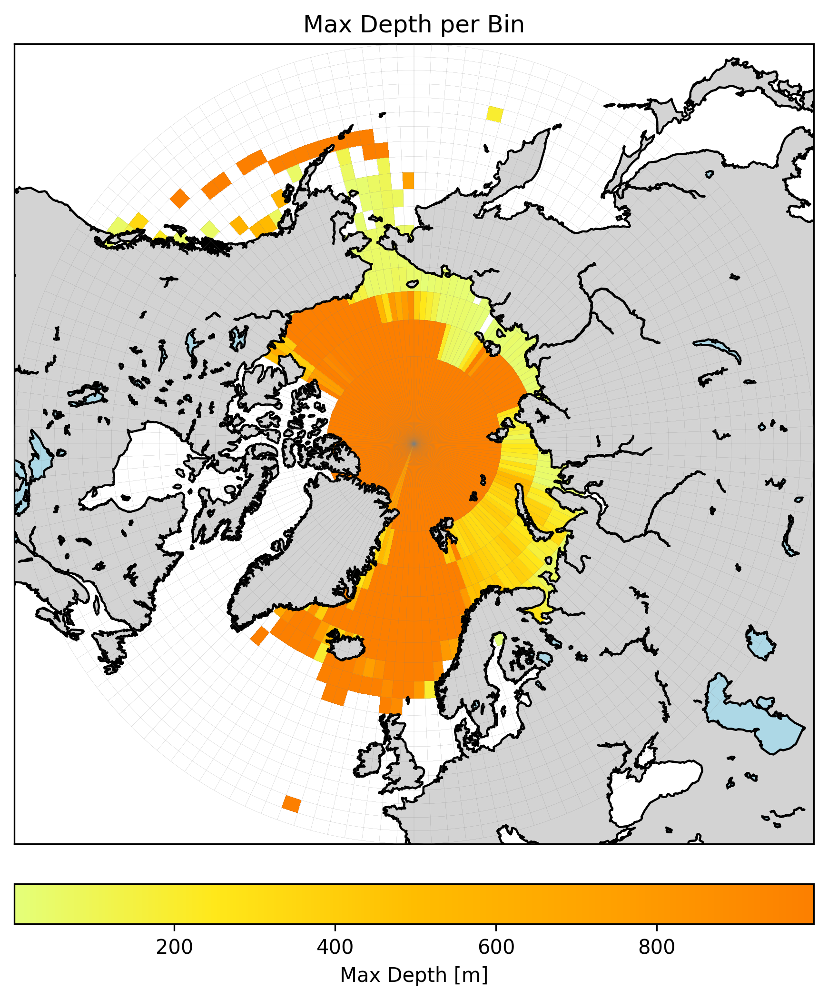

bin max=995.0


In [8]:
plot_heatmap(df_sampled, n_lon_bins=144, n_lat_bins=18)

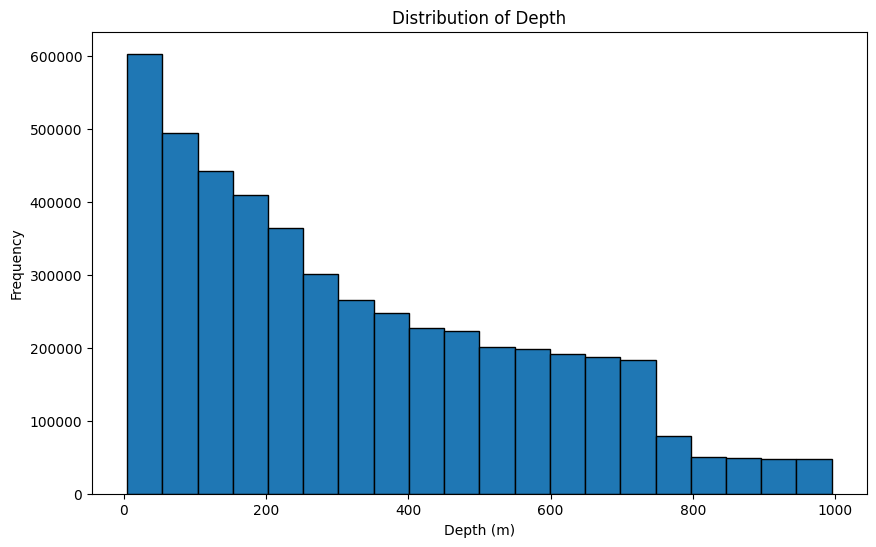

In [9]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Distribution of Depth')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

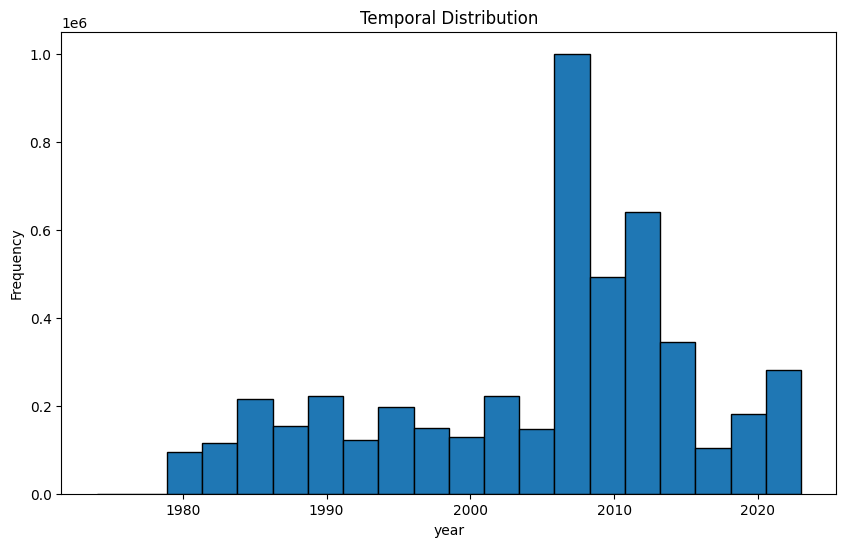

In [10]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

In [11]:
def plot_heatmap_npts(ds_cleaned, n_lon_bins=72, n_lat_bins=9):
    lon_min, lon_max = -180, 180
    lat_min, lat_max = 45, 90
    resolution = 'l'

    # Equal-area bins: uniform in longitude, uniform in sin(latitude)
    lon_bins = np.linspace(lon_min, lon_max, n_lon_bins + 1)
    sin_min = np.sin(np.radians(lat_min))
    sin_max = np.sin(np.radians(lat_max))
    sin_bins = np.linspace(sin_min, sin_max, n_lat_bins + 1)
    lat_bins = np.degrees(np.arcsin(sin_bins))

    # Find number of points per bin
    count = np.zeros((n_lon_bins, n_lat_bins), dtype=int)
    for i in range(len(lon_bins)-1):
        for j in range(len(lat_bins)-1):
            count[i,j] = ds_cleaned[ds_cleaned['Longitude_[deg_E]'].between(lon_bins[i], lon_bins[i+1]) & ds_cleaned['Latitude_[deg_N]'].between(lat_bins[j], lat_bins[j+1])].shape[0]

    fig = plt.figure(figsize=(8,8), dpi=300)
    m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution=resolution)

    m.drawcoastlines()
    m.fillcontinents(color='grey', lake_color='lightblue')

    # Draw sine-lat bin edges as lightgrey lines
    # Latitude lines (at each lat_bins edge)
    for lat in lat_bins:
        lons = np.linspace(lon_min, lon_max, 500)
        lats = np.full_like(lons, lat)
        x, y = m(lons, lats)
        m.plot(x, y, color='grey', linewidth=0.05, zorder=3)

    # Longitude lines (at each lon_bins edge)
    for lon in lon_bins:
        lats = np.linspace(lat_min, lat_max, 500)
        lons = np.full_like(lats, lon)
        x, y = m(lons, lats)
        m.plot(x, y, color='grey', linewidth=0.05, zorder=3)

    # Plot data on top
    X, Y = np.meshgrid(lon_bins, lat_bins)
    X_map, Y_map = m(X, Y)

    cmap = plt.get_cmap('Wistia').copy()
    cmap.set_under(color='white', alpha=1.0)
    cmap.set_over(color='white', alpha=1.0)

    m.pcolormesh(X_map, Y_map, count.T, cmap=cmap, vmin=1, vmax=None)

    # Redraw coastlines on top of pcolormesh
    m.drawcoastlines()
    m.fillcontinents(color='lightgrey', lake_color='lightblue')

    cbar = m.colorbar(location='bottom', pad="5%")
    cbar.set_label('Number of points in bin')

    plt.xticks([])
    plt.yticks([])
    plt.title('Number of Points per Bin')

    plt.show()

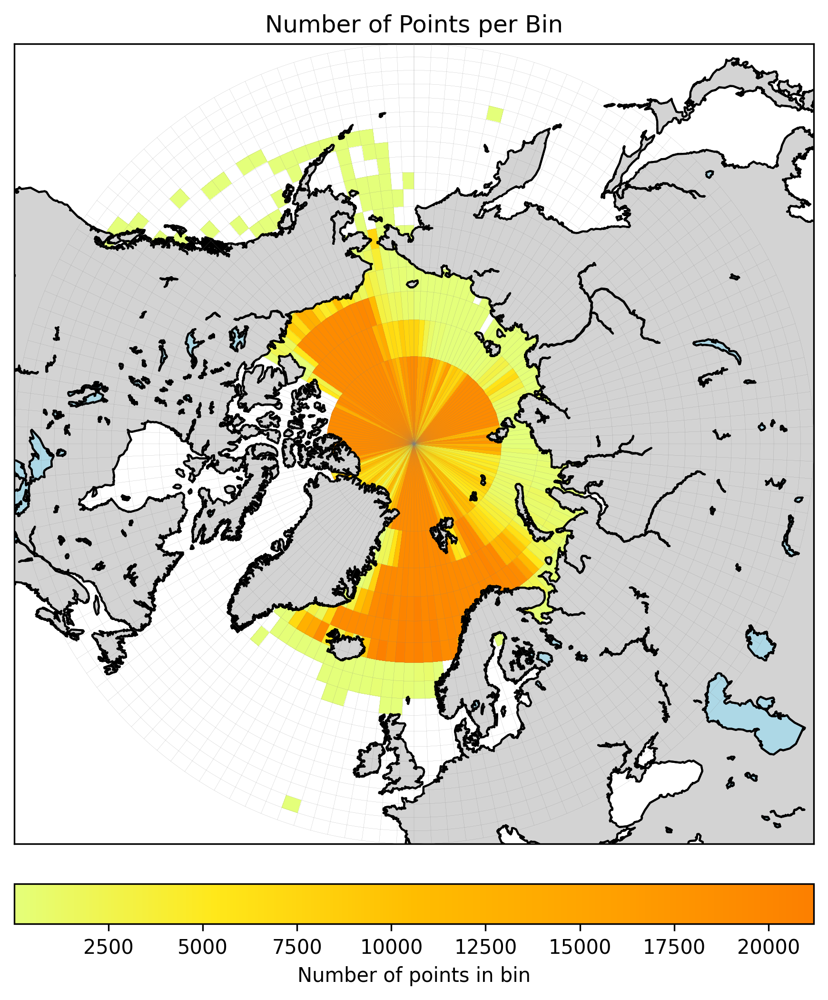

In [12]:
plot_heatmap_npts(df_sampled, n_lon_bins=144, n_lat_bins=18)

# Method 2 - lat lon bins of equal area (uniform lon and uniform sin lat) and divide each bin into 5 depth bins sample geographically and vertically

In [13]:
# Sample bins of bins (geographical and depth bins)
def sample_bins_of_bins(df, n_lon_bins=72, n_lat_bins=9, n_depth_bins=5, min_flag=True):
    # Define area of interest (Arctic Ocean)
    lon_min, lon_max = -180, 180
    lat_min, lat_max = 45, 90

    # Equal-area bins: uniform in longitude, uniform in sin(latitude)
    lon_bins = np.linspace(lon_min, lon_max, n_lon_bins + 1)
    sin_min = np.sin(np.radians(lat_min))
    sin_max = np.sin(np.radians(lat_max))
    sin_bins = np.linspace(sin_min, sin_max, n_lat_bins + 1)
    lat_bins = np.degrees(np.arcsin(sin_bins))
    depth_bins = np.linspace(df['Depth_[m]'].min(), df['Depth_[m]'].max(), n_depth_bins + 1)

    # Assign each point to a bin
    df['lon_bin'] = pd.cut(df['Longitude_[deg_E]'], bins=lon_bins, labels=False, include_lowest=True)
    df['lat_bin'] = pd.cut(df['Latitude_[deg_N]'], bins=lat_bins, labels=False, include_lowest=True)
    df['depth_bin'] = pd.cut(df['Depth_[m]'], bins=depth_bins, labels=False, include_lowest=True)
    
    # Find bin with least data points and sample that many points from each bin
    if min_flag:
        min_count = df.groupby(['lon_bin', 'lat_bin','depth_bin']).size().min()
        sampled_df = df.groupby(['lon_bin', 'lat_bin', 'depth_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)
    else: 
        avg_count = df.groupby(['lon_bin', 'lat_bin', 'depth_bin']).size().mean().round().astype(int)
        sampled_df = (df.groupby(['lon_bin', 'lat_bin', 'depth_bin'], group_keys=False).apply(lambda g: g.sample(n=min(len(g), avg_count), random_state=22)).reset_index(drop=True))
    return sampled_df


In [14]:
df_sampled = sample_bins_of_bins(df_ST, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24966/3877500181.py:26: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = (df.groupby(['lon_bin', 'lat_bin', 'depth_bin'], group_keys=False).apply(lambda g: g.sample(n=min(len(g), avg_count), random_state=22)).reset_index(drop=True))


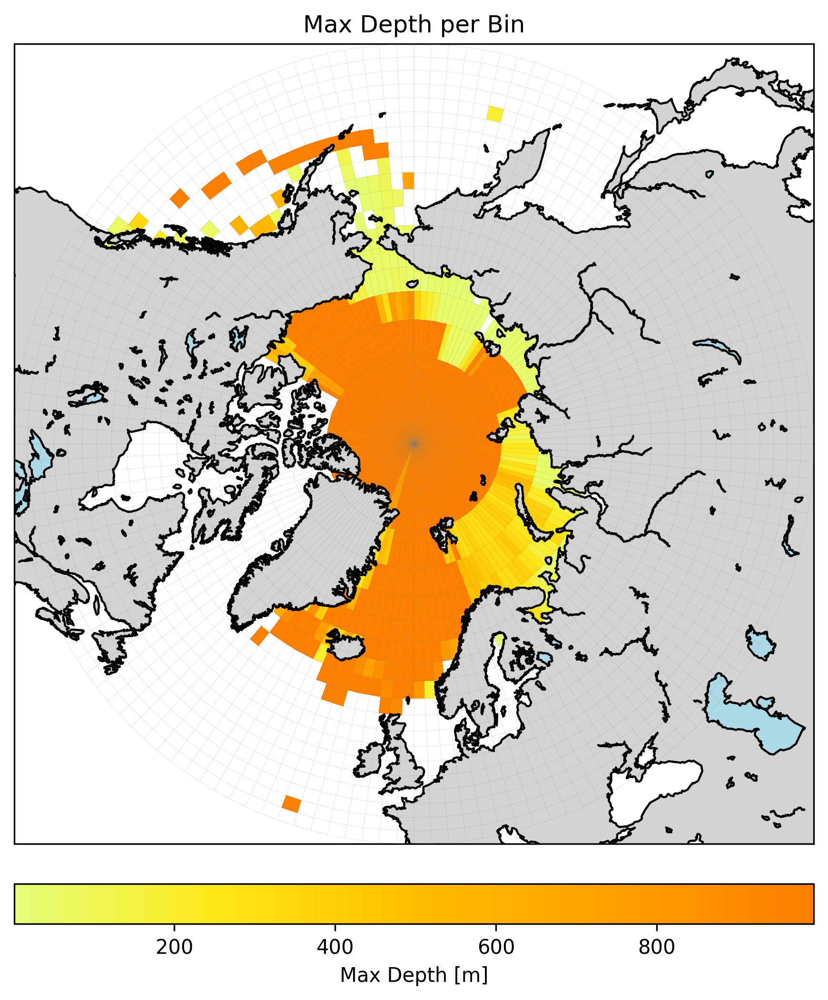

bin max=995.0


In [15]:
plot_heatmap(df_sampled, n_lon_bins=144, n_lat_bins=18)

In [ ]:
plot_heatmap_npts(df_sampled, n_lon_bins=144, n_lat_bins=18)

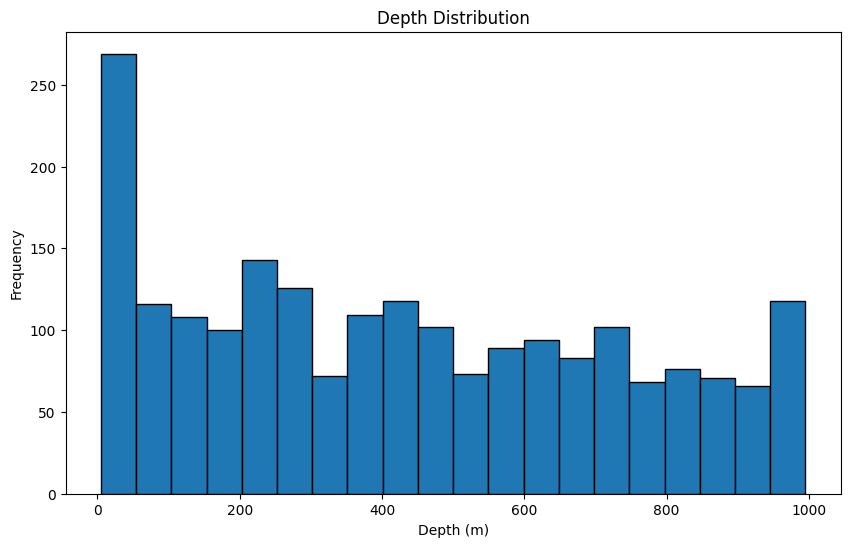

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

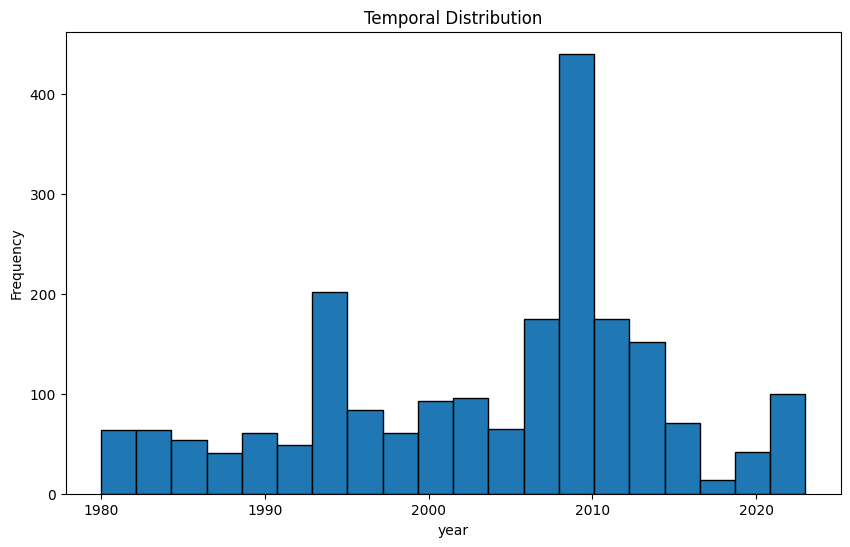

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 3 - lat lon bins of equal area (uniform lon and uniform sin lat) and divide each bin into 5 depth bins sample geographically and vertically, divide dataset into first 20 years and last 23 years sample separately and combine after

In [ ]:
df_sampled_0 = sample_bins_of_bins(df_80_00, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)
df_sampled_1 = sample_bins_of_bins(df_00_23, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)
df_sampled = pd.concat([df_sampled_0, df_sampled_1], ignore_index=True)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lon_bin'] = pd.cut(df['Longitude_[deg_E]'], bins=lon_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lat_bin'] = pd.cut(df['Latitude_[deg_N]'], bins=lat_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_

In [ ]:
plot_heatmap(df_sampled, n_lon_bins=144, n_lat_bins=18)

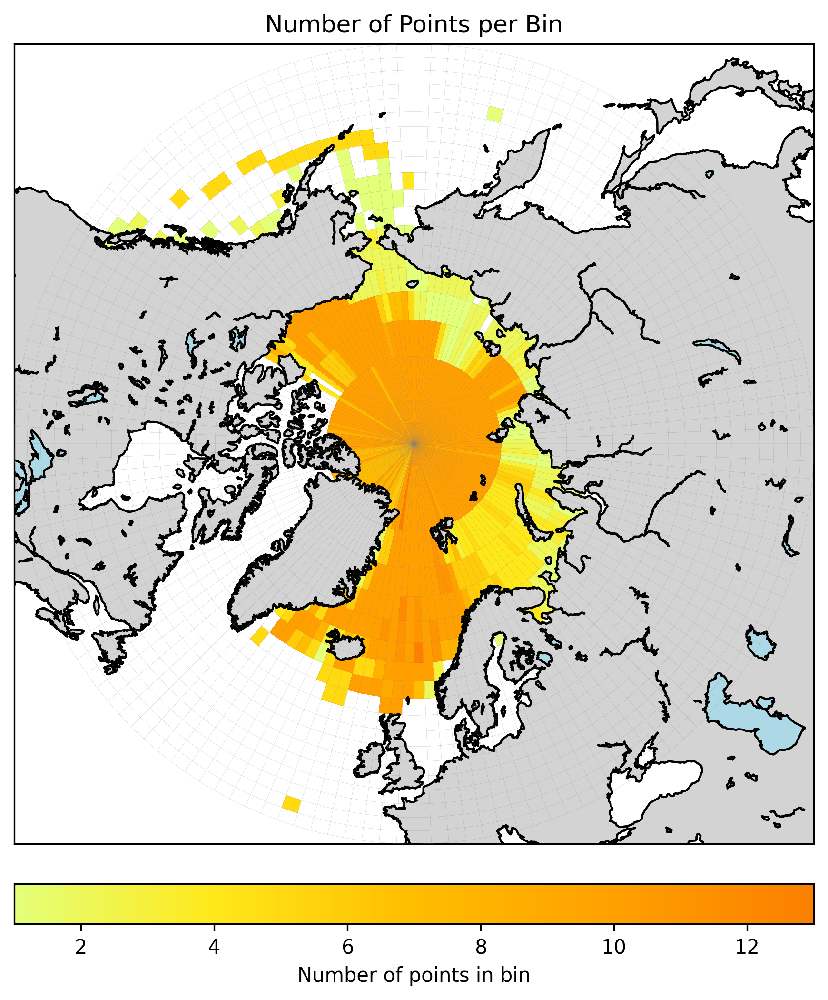

In [ ]:
plot_heatmap_npts(df_sampled, n_lon_bins=144, n_lat_bins=18)

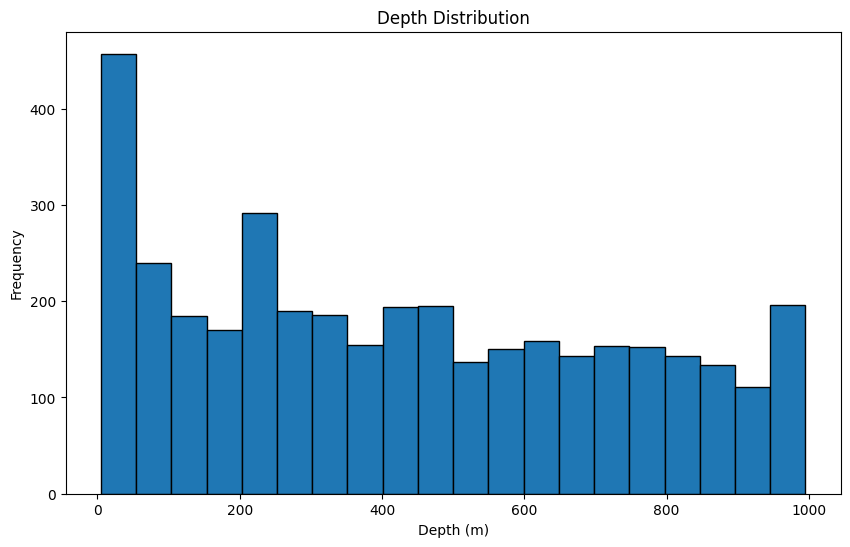

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

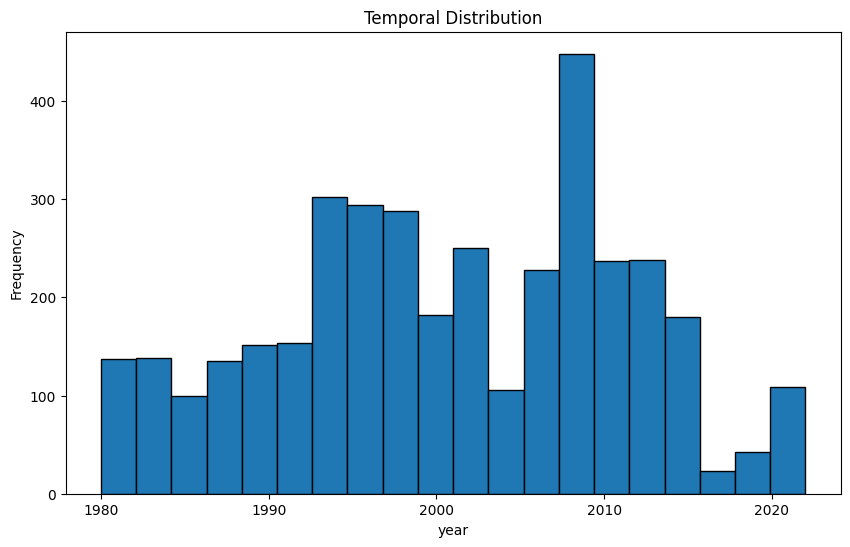

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 4 - lat lon bins of equal area (uniform lon and uniform sin lat) and divide each bin into 5 depth bins sample geographically and vertically, divide dataset into 4 decadal bins, sample separately and combine after

In [ ]:
# Divide dataset into 4 decades (1980-1990, 1990-2000, 2000-2010, 2010-2023)
df_80_90 = df_ST[(df_ST['year'] >= 1980) & (df_ST['year'] < 1990)]
df_90_00 = df_ST[(df_ST['year'] >= 1990) & (df_ST['year'] < 2000)]
df_00_10 = df_ST[(df_ST['year'] >= 2000) & (df_ST['year'] < 2010)]
df_10_23 = df_ST[(df_ST['year'] >= 2010) & (df_ST['year'] < 2023)]

In [ ]:
# Sample bins of bins (geographical and depth bins) for each decade
df_sampled_0 = sample_bins_of_bins(df_80_90, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)
df_sampled_1 = sample_bins_of_bins(df_90_00, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)
df_sampled_2 = sample_bins_of_bins(df_00_10, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)
df_sampled_3 = sample_bins_of_bins(df_10_23, n_lon_bins=144, n_lat_bins=18, n_depth_bins=5, min_flag=flag)

# Concatenate sampled dataframes for all decades
df_sampled = pd.concat([df_sampled_0, df_sampled_1, df_sampled_2, df_sampled_3], ignore_index=True)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lon_bin'] = pd.cut(df['Longitude_[deg_E]'], bins=lon_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lat_bin'] = pd.cut(df['Latitude_[deg_N]'], bins=lat_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_

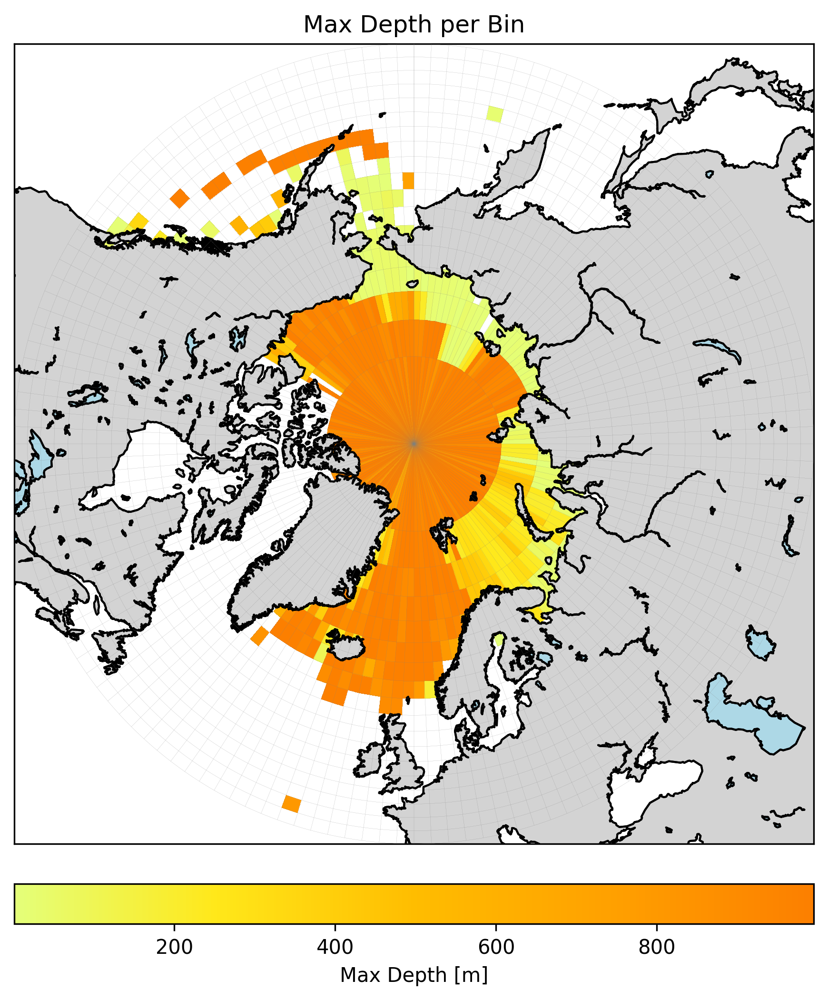

bin max=995.0


In [ ]:
plot_heatmap(df_sampled, n_lon_bins=144, n_lat_bins=18)

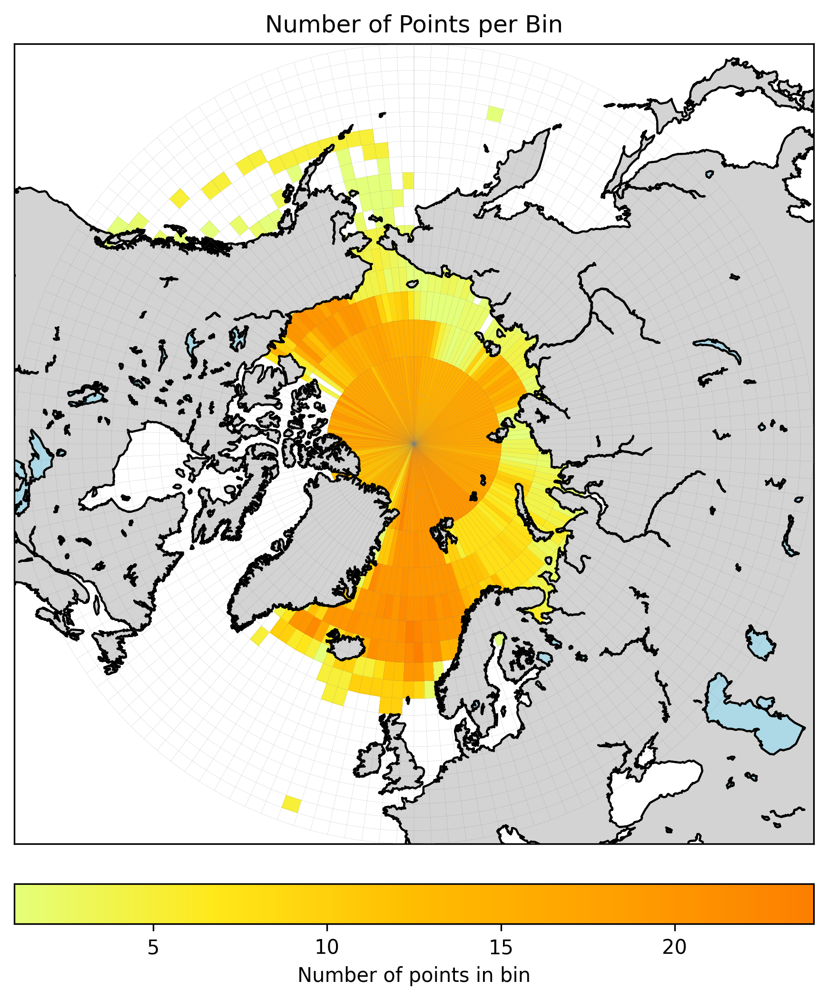

In [ ]:
plot_heatmap_npts(df_sampled, n_lon_bins=144, n_lat_bins=18)

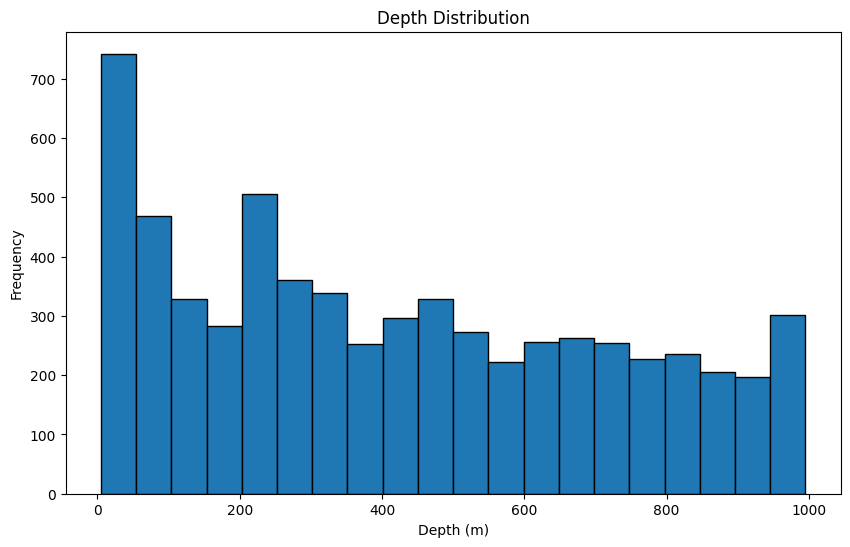

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

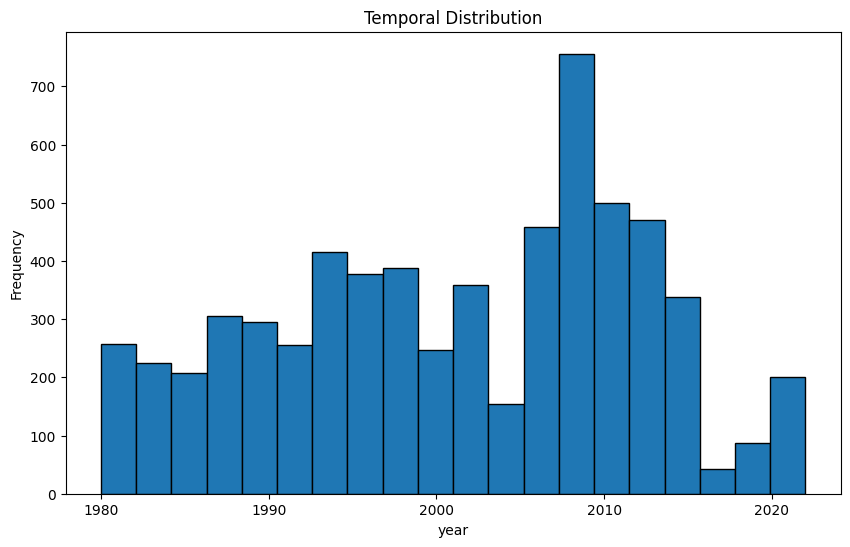

In [ ]:
# Data distribution in years
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 5 - lat lon bins of equal area (uniform lon and uniform sin lat) and divide each bin into 10 depth bins sample geographically and vertically

In [ ]:
df_sampled = sample_bins_of_bins(df_ST, n_lon_bins=144, n_lat_bins=18, n_depth_bins=10, min_flag=flag)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:23: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby(['lon_bin', 'lat_bin', 'depth_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)


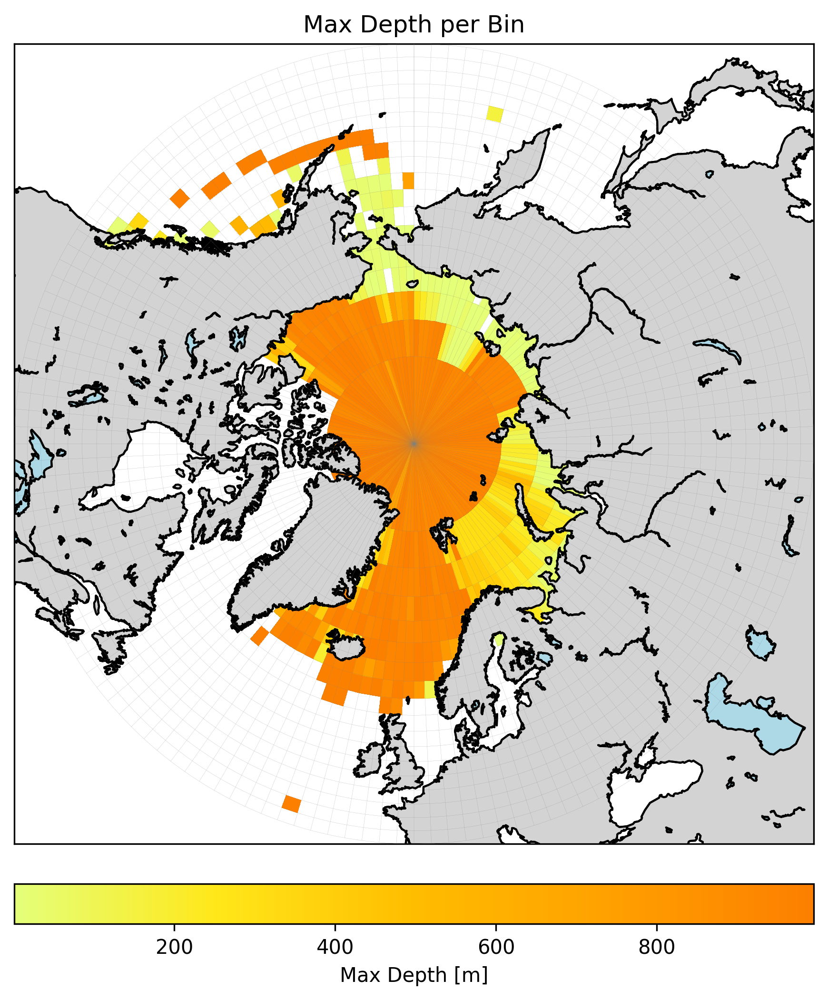

bin max=995.0


In [ ]:
plot_heatmap(df_sampled, n_lon_bins=144, n_lat_bins=18)

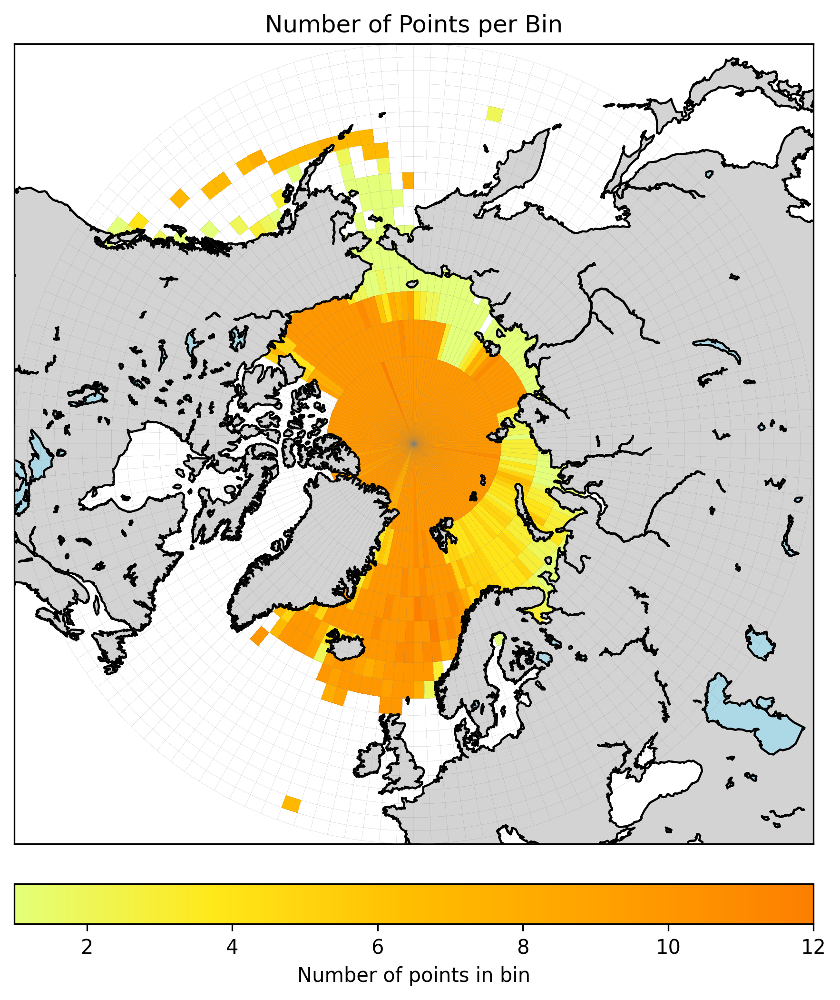

In [ ]:
plot_heatmap_npts(df_sampled, n_lon_bins=144, n_lat_bins=18)

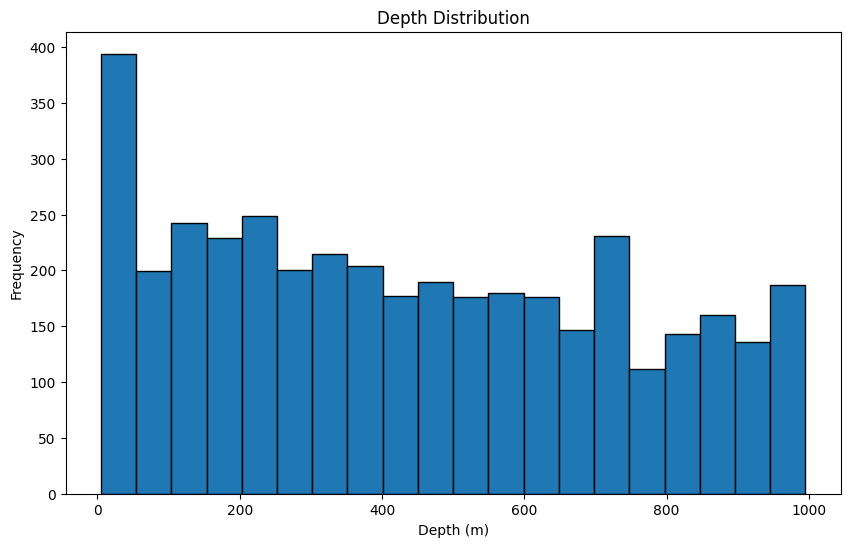

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

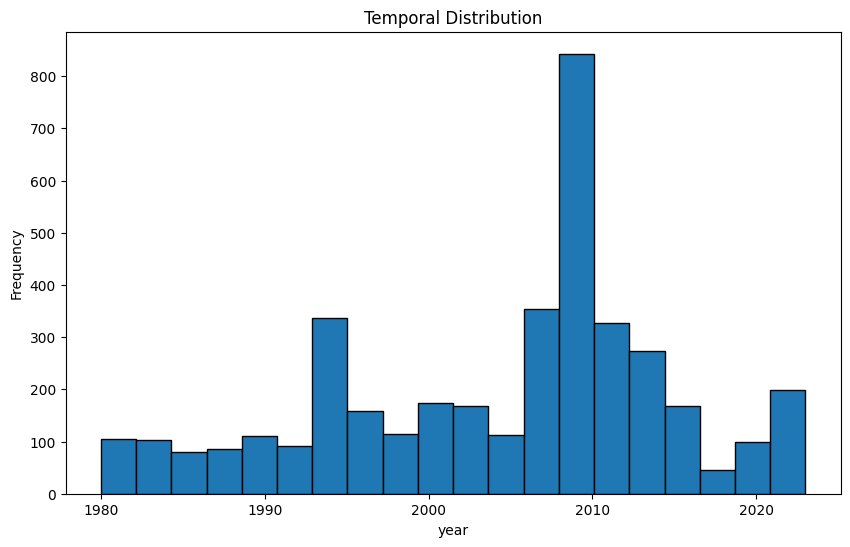

In [ ]:
# Data distribution in years
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 6 - lat lon bins of equal area (uniform lon and uniform sin lat) and divide each bin into 10 depth bins sample geographically and vertically, divide 20 years

In [ ]:
df_sampled_0 = sample_bins_of_bins(df_80_00, n_lon_bins=144, n_lat_bins=18, n_depth_bins=10, min_flag=flag)
df_sampled_1 = sample_bins_of_bins(df_00_23, n_lon_bins=144, n_lat_bins=18, n_depth_bins=10, min_flag=flag)
df_sampled = pd.concat([df_sampled_0, df_sampled_1], ignore_index=True)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lon_bin'] = pd.cut(df['Longitude_[deg_E]'], bins=lon_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_24613/3877500181.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lat_bin'] = pd.cut(df['Latitude_[deg_N]'], bins=lat_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_

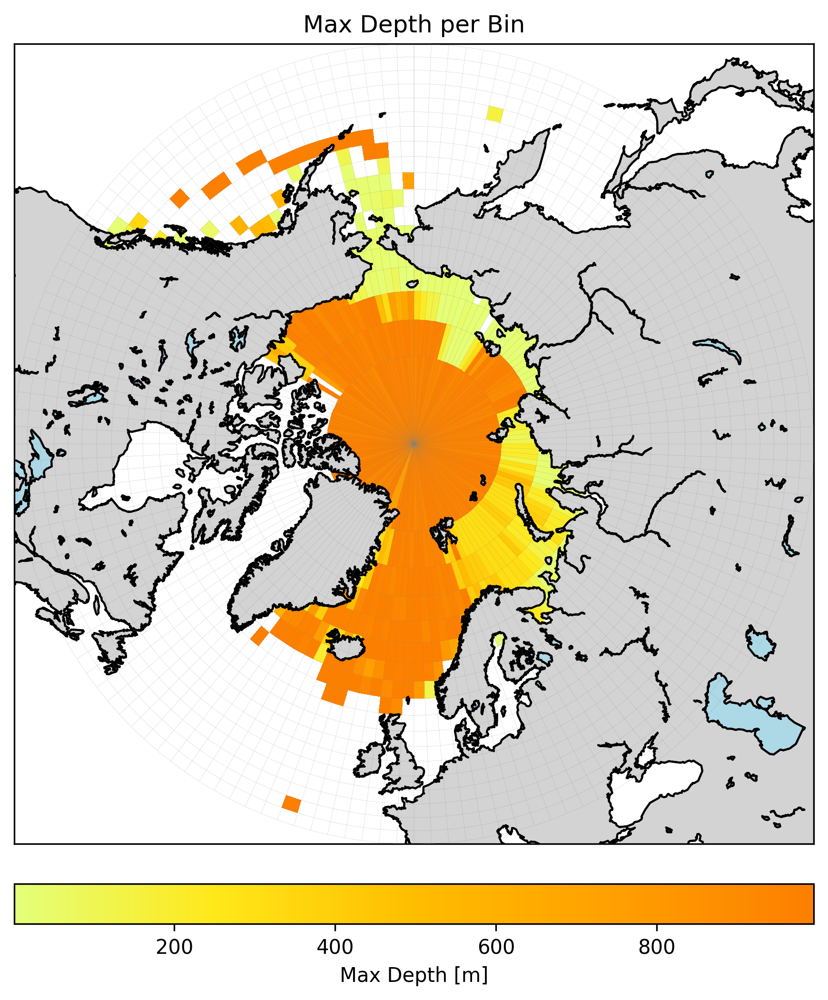

bin max=995.0


In [ ]:
plot_heatmap(df_sampled, n_lon_bins=144, n_lat_bins=18)

In [ ]:
plot_heatmap_npts(df_sampled, n_lon_bins=144, n_lat_bins=18)

KeyboardInterrupt: 

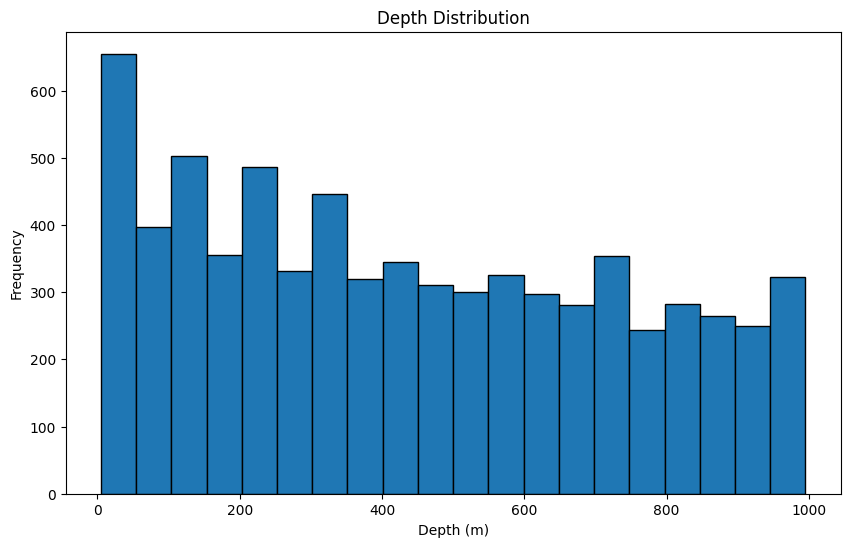

In [ ]:
# Data distribution in depth
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

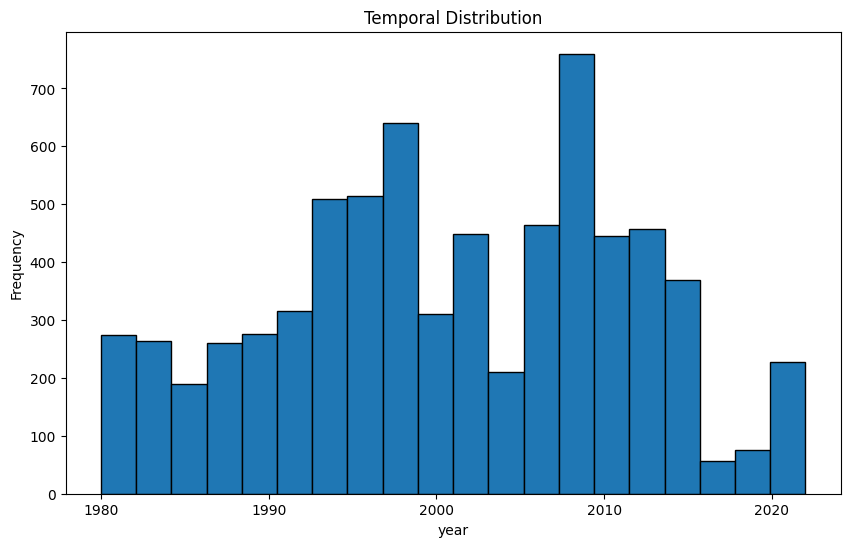

In [ ]:
# Data distribution in years
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Reprojections

In [ ]:
def plot_heatmap_xy(ds_cleaned, n_x_bins=100, n_y_bins=100, bin_max=None, projection='npstere', projection_name='Polar Stereographic'):
    lat_min = ds_cleaned['Latitude_[deg_N]'].min()
    resolution = 'l'

    fig = plt.figure(figsize=(8, 8), dpi=300)
    m = Basemap(projection=projection, boundinglat=lat_min, lon_0=0, resolution=resolution)

    # Convert lat/lon → x/y (projection coordinates in meters)
    lon_vals = ds_cleaned['Longitude_[deg_E]'].values
    lat_vals = ds_cleaned['Latitude_[deg_N]'].values
    depth_vals = ds_cleaned['Depth_[m]'].values

    # Reproject lat/lon to x/y
    x_vals, y_vals = m(lon_vals, lat_vals)

    # Define XY bin edges
    x_min, x_max = x_vals.min(), x_vals.max()
    y_min, y_max = y_vals.min(), y_vals.max()

    x_bins = np.linspace(x_min, x_max, n_x_bins + 1)
    y_bins = np.linspace(y_min, y_max, n_y_bins + 1)

    # Grid to store max depth
    H = np.zeros((n_x_bins, n_y_bins))

    # Digitize into bins
    x_idx = np.digitize(x_vals, x_bins) - 1
    y_idx = np.digitize(y_vals, y_bins) - 1

    # Fill grid with max depth
    for i in range(len(x_vals)):
        xi, yi = x_idx[i], y_idx[i]
        if 0 <= xi < n_x_bins and 0 <= yi < n_y_bins:
            if depth_vals[i] > H[xi, yi]:
                H[xi, yi] = depth_vals[i]

    # Create meshgrid for plotting
    X, Y = np.meshgrid(x_bins, y_bins)

    # Colormap
    cmap = plt.get_cmap('Wistia').copy()
    cmap.set_under(color='white', alpha=1.0)
    cmap.set_over(color='white', alpha=1.0)

    if bin_max is None:
        bin_max = H.max()

    # Plot heatmap
    m.pcolormesh(X, Y, H.T, cmap=cmap, vmin=1, vmax=bin_max)

    # Optional: draw bin grid (in xy space)
    for xb in x_bins:
        plt.plot([xb]*len(y_bins), y_bins, color='grey', linewidth=0.05, zorder=3)
    for yb in y_bins:
        plt.plot(x_bins, [yb]*len(x_bins), color='grey', linewidth=0.05, zorder=3)

    # Plot coastlines on top
    m.drawcoastlines()
    m.fillcontinents(color='lightgrey', lake_color='lightblue')

    cbar = m.colorbar(location='bottom', pad="5%")
    cbar.set_label('Max Depth [m]')

    plt.xticks([])
    plt.yticks([])
    plt.title('Max Depth per Bin '+ f'({projection_name} Projection)')

    plt.show()
    print(f'bin max={bin_max}')

In [ ]:
def plot_heatmap_npts_xy(ds_cleaned, n_x_bins=100, n_y_bins=100, bin_max=None, projection='npstere', projection_name='Polar Stereographic'):
    lat_min = ds_cleaned['Latitude_[deg_N]'].min()
    resolution = 'l'

    fig = plt.figure(figsize=(8, 8), dpi=300)
    m = Basemap(projection=projection, boundinglat=lat_min, lon_0=0, resolution=resolution)

    # Convert lat/lon → x/y (projection coordinates in meters)
    lon_vals = ds_cleaned['Longitude_[deg_E]'].values
    lat_vals = ds_cleaned['Latitude_[deg_N]'].values

    # Reproject lat/lon to x/y
    x_vals, y_vals = m(lon_vals, lat_vals)

    # Define XY bin edges
    x_min, x_max = x_vals.min(), x_vals.max()
    y_min, y_max = y_vals.min(), y_vals.max()

    x_bins = np.linspace(x_min, x_max, n_x_bins + 1)
    y_bins = np.linspace(y_min, y_max, n_y_bins + 1)

    # Grid to store max depth
    H = np.zeros((n_x_bins, n_y_bins))

    # Digitize into bins
    x_idx = np.digitize(x_vals, x_bins) - 1
    y_idx = np.digitize(y_vals, y_bins) - 1

    # Count number of points in each bin
    for i in range(len(x_vals)):
        xi, yi = x_idx[i], y_idx[i]
        if 0 <= xi < n_x_bins and 0 <= yi < n_y_bins:
            H[xi, yi] += 1

    # Create meshgrid for plotting
    X, Y = np.meshgrid(x_bins, y_bins)

    # Colormap
    cmap = plt.get_cmap('Wistia').copy()
    cmap.set_under(color='white', alpha=1.0)
    cmap.set_over(color='white', alpha=1.0)

    if bin_max is None:
        bin_max = H.max()

    # Plot heatmap
    m.pcolormesh(X, Y, H.T, cmap=cmap, vmin=1, vmax=bin_max)

    # Draw bin grid (in xy space)
    for xb in x_bins:
        plt.plot([xb]*len(y_bins), y_bins, color='grey', linewidth=0.05, zorder=3)
    for yb in y_bins:
        plt.plot(x_bins, [yb]*len(x_bins), color='grey', linewidth=0.05, zorder=3)

    # Plot coastlines on top
    m.drawcoastlines()
    m.fillcontinents(color='lightgrey', lake_color='lightblue')

    cbar = m.colorbar(location='bottom', pad="5%")
    cbar.set_label('Number of points per bin')

    plt.xticks([])
    plt.yticks([])
    plt.title('Number of Points per Bin in '+ f'({projection_name} Projection)')

    plt.show()

# Method 7 - reproject to polar stereographic sample bins geographically like method 1

In [ ]:
# Sample xy bins uniformly (geographically)
def sample_bins_proj(df, n_x_bins=100, n_y_bins=100, projection='npstere', min_flag=True):
    # Define area of interest (Arctic Ocean)
    lat_min = df['Latitude_[deg_N]'].min()

    # Convert lat/lon → x/y (projection coordinates in meters)
    lon_vals = df['Longitude_[deg_E]'].values
    lat_vals = df['Latitude_[deg_N]'].values
    x_vals, y_vals = Basemap(projection=projection, boundinglat=lat_min, lon_0=0, resolution='l')(lon_vals, lat_vals)

    x_min, x_max = x_vals.min(), x_vals.max()
    y_min, y_max = y_vals.min(), y_vals.max()

    # xy bins in projection space
    x_bins = np.linspace(x_min, x_max, n_x_bins + 1)
    y_bins = np.linspace(y_min, y_max, n_y_bins + 1)

    # Assign each point to a bin
    df['x_bin'] = pd.cut(x_vals, bins=x_bins, labels=False, include_lowest=True)
    df['y_bin'] = pd.cut(y_vals, bins=y_bins, labels=False, include_lowest=True)    
    
    # Find bin with least data points and sample that many points from each bin
    if min_flag:
        min_count = df.groupby(['x_bin', 'y_bin']).size().min()
        sampled_df = df.groupby(['x_bin', 'y_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)
    else:
        avg_count = df.groupby(['x_bin', 'y_bin']).size().mean().round().astype(int)
        sampled_df = (df.groupby(['x_bin', 'y_bin'], group_keys=False).apply(lambda g: g.sample(n=min(len(g), avg_count), random_state=22)).reset_index(drop=True))
    return sampled_df


In [ ]:
df_sampled = sample_bins_proj(df_ST, n_x_bins=100, n_y_bins=100, projection='npstere', min_flag=flag)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/1742845558.py:25: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby(['x_bin', 'y_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)


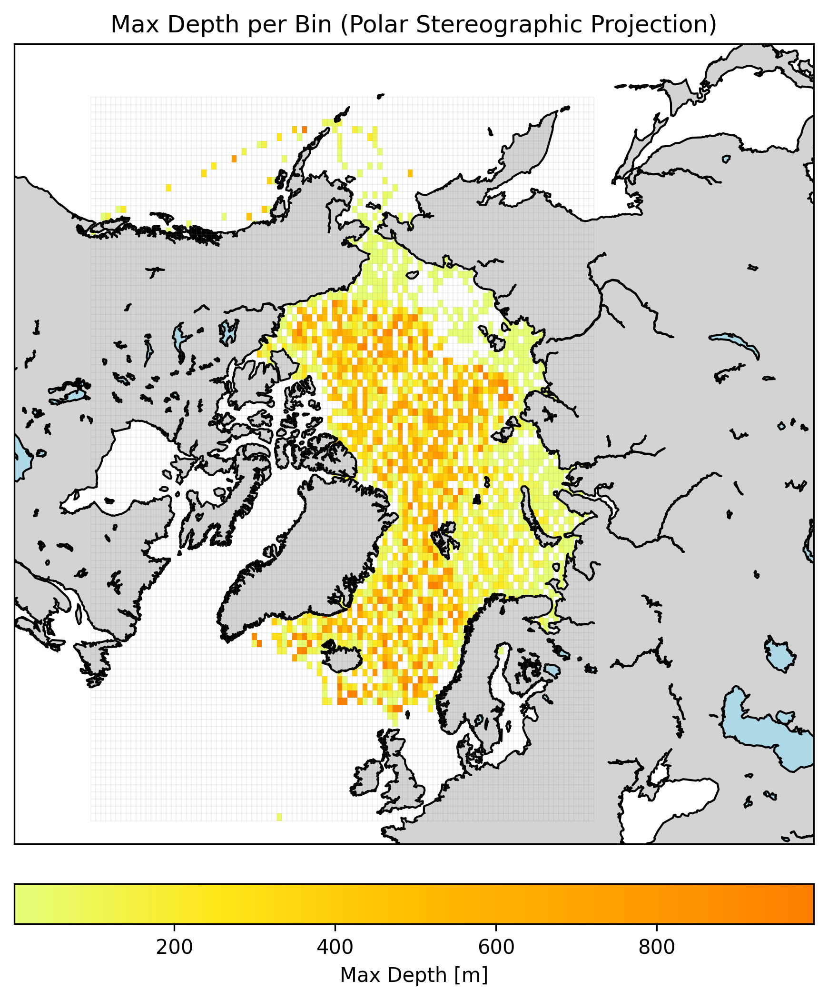

bin max=995.0


In [ ]:
plot_heatmap_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='npstere', projection_name='Polar Stereographic')

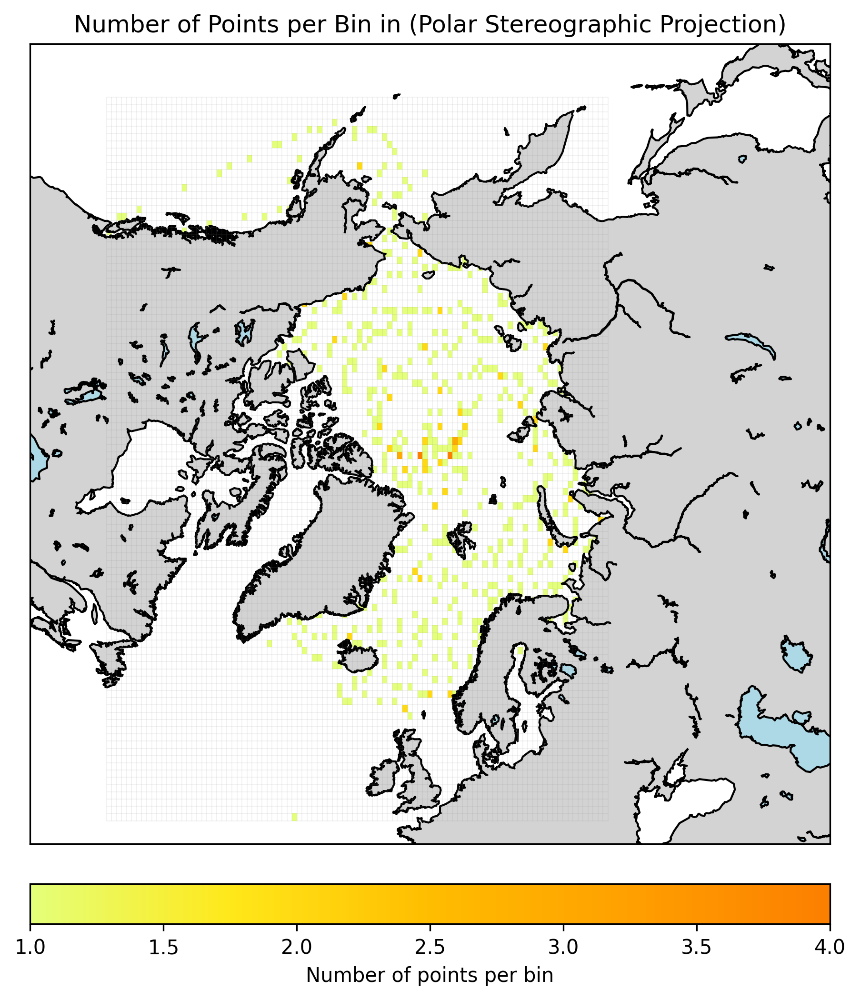

In [ ]:
plot_heatmap_npts_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='npstere', projection_name='Polar Stereographic')

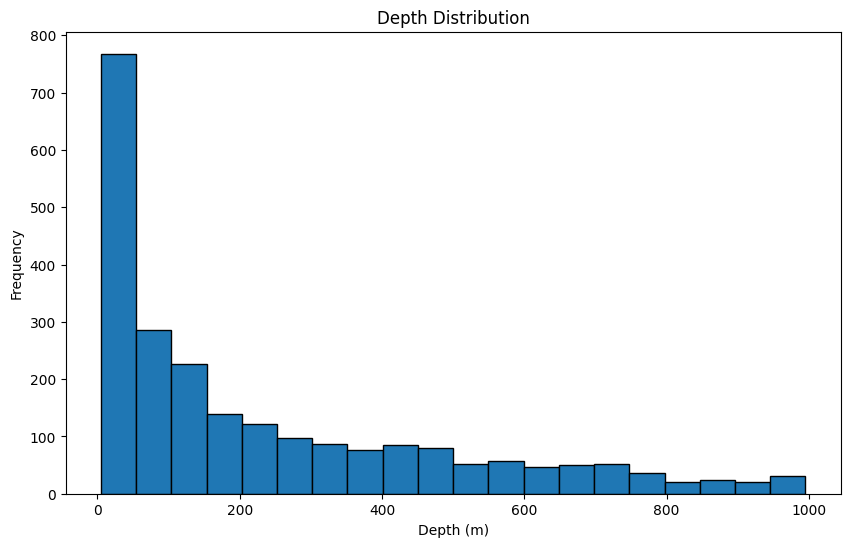

In [ ]:
# Histogram of depth distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

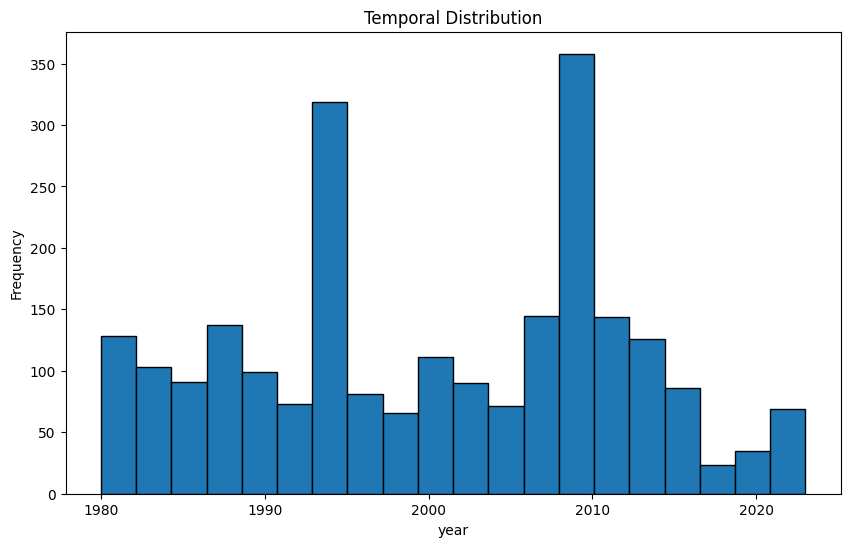

In [ ]:
# Histogram of temporal distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 8 - reproject to polar stereographic projection, sample geographically and depth wise (5 layers)

In [ ]:
# Sample bins of bins (geographical and depth bins) in projection space
def sample_bins_of_bins_proj(df, n_x_bins=100, n_y_bins=100, n_depth_bins=5, projection='npstere', min_flag=True):
    # Define minimum latitude for projection
    lat_min = df['Latitude_[deg_N]'].min()

    # Convert lat/lon → x/y (projection coordinates in meters)
    lon_vals = df['Longitude_[deg_E]'].values
    lat_vals = df['Latitude_[deg_N]'].values
    x_vals, y_vals = Basemap(projection=projection, boundinglat=lat_min, lon_0=0, resolution='l')(lon_vals, lat_vals)

    x_min, x_max = x_vals.min(), x_vals.max()
    y_min, y_max = y_vals.min(), y_vals.max()

    # xy bins in projection space
    x_bins = np.linspace(x_min, x_max, n_x_bins + 1)
    y_bins = np.linspace(y_min, y_max, n_y_bins + 1)

    # depth bins in original depth space
    depth_bins = np.linspace(df['Depth_[m]'].min(), df['Depth_[m]'].max(), n_depth_bins + 1)

    # Assign each point to a bin
    df['x_bin'] = pd.cut(x_vals, bins=x_bins, labels=False, include_lowest=True)
    df['y_bin'] = pd.cut(y_vals, bins=y_bins, labels=False, include_lowest=True)  
    df['depth_bin'] = pd.cut(df['Depth_[m]'], bins=depth_bins, labels=False, include_lowest=True)
    
    # Find bin with least data points and sample that many points from each bin
    if min_flag:
        min_count = df.groupby(['x_bin', 'y_bin', 'depth_bin']).size().min()
        sampled_df = df.groupby(['x_bin', 'y_bin', 'depth_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)
    else:
        avg_count = df.groupby(['x_bin', 'y_bin', 'depth_bin']).size().mean().round().astype(int)
        sampled_df = (df.groupby(['x_bin', 'y_bin', 'depth_bin'], group_keys=False).apply(lambda g: g.sample(n=min(len(g), avg_count), random_state=22)).reset_index(drop=True))
    return sampled_df

In [ ]:
df_sampled = sample_bins_of_bins_proj(df_ST, n_x_bins=100, n_y_bins=100, n_depth_bins=5, projection='npstere', min_flag=flag)

min count per bin: 1


/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/544306129.py:30: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby(['x_bin', 'y_bin', 'depth_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)


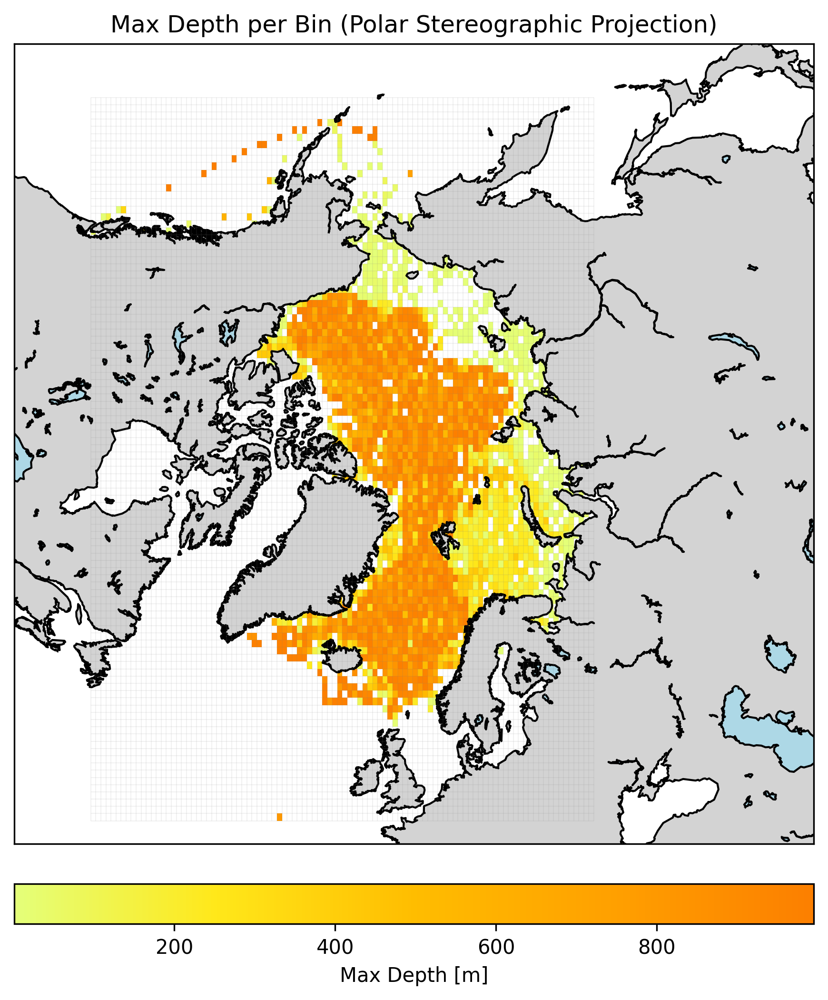

bin max=995.0


In [ ]:
plot_heatmap_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='npstere', projection_name='Polar Stereographic')

In [ ]:
plot_heatmap_npts_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='npstere', projection_name='Polar Stereographic')

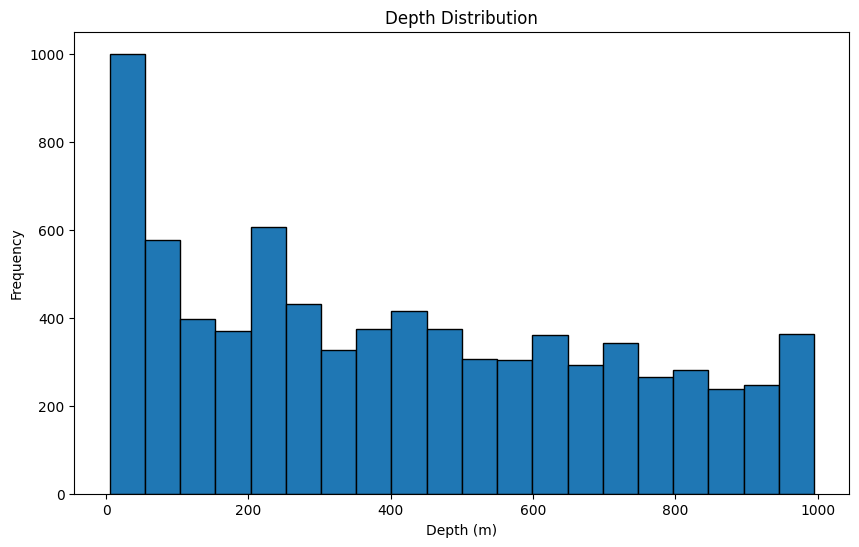

In [ ]:
# Histogram of depth distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

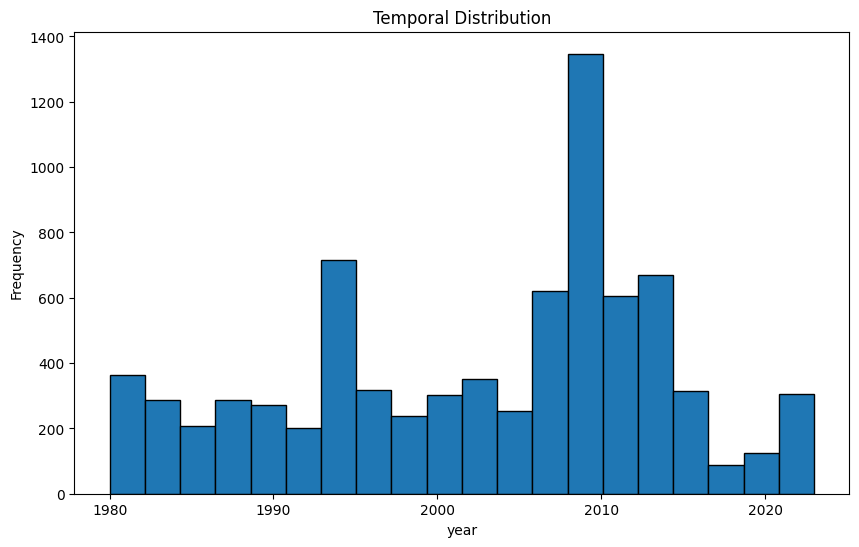

In [ ]:
# Histogram of temporal distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 9 - reproject to polar stereographic projection, sampled geographically and depth wise, separate into first and last 20 years

In [ ]:
df_sampled_0 = sample_bins_of_bins_proj(df_80_00, projection='npstere', min_flag=flag)
df_sampled_1 = sample_bins_of_bins_proj(df_00_23, projection='npstere', min_flag=flag)
df_sampled = pd.concat([df_sampled_0, df_sampled_1], ignore_index=True)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['x_bin'] = pd.cut(x_vals, bins=x_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['y_bin'] = pd.cut(y_vals, bins=y_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:24: SettingWithCopyWa

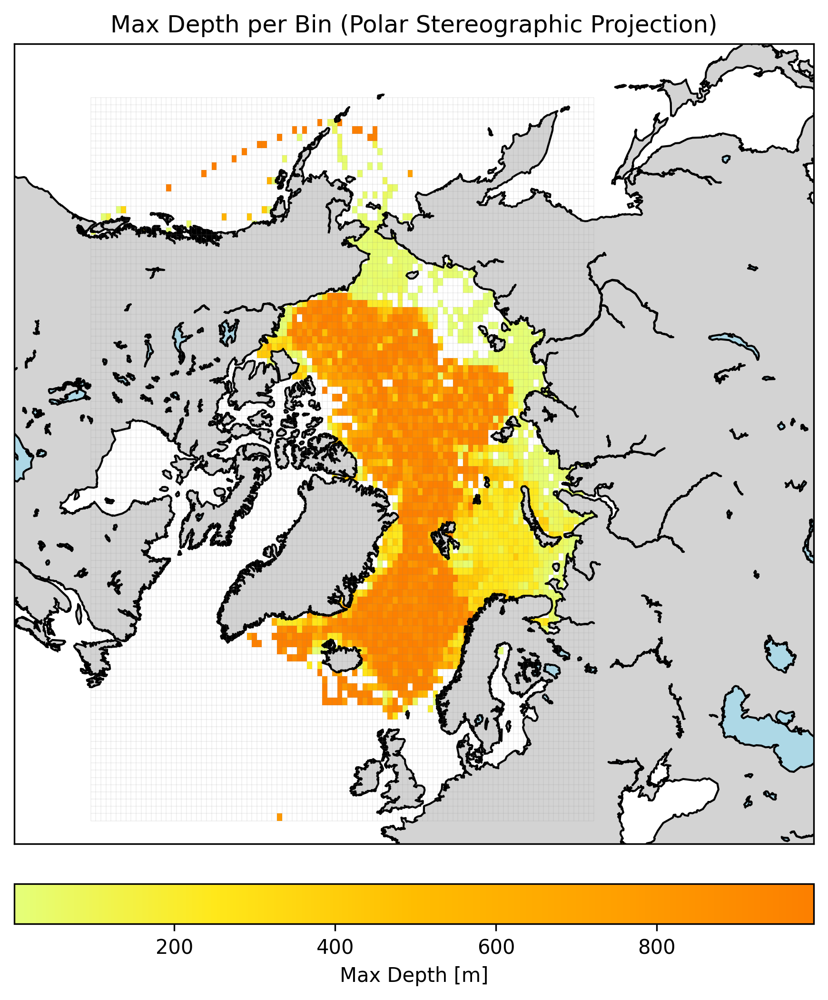

bin max=995.0


In [ ]:
plot_heatmap_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='npstere', projection_name='Polar Stereographic')

In [ ]:
plot_heatmap_npts_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='npstere', projection_name='Polar Stereographic')

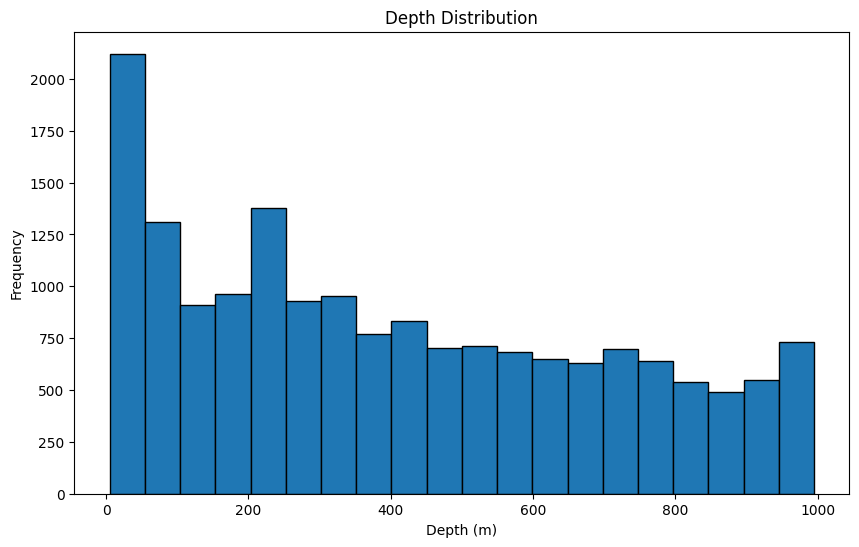

In [ ]:
# Histogram of depth distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

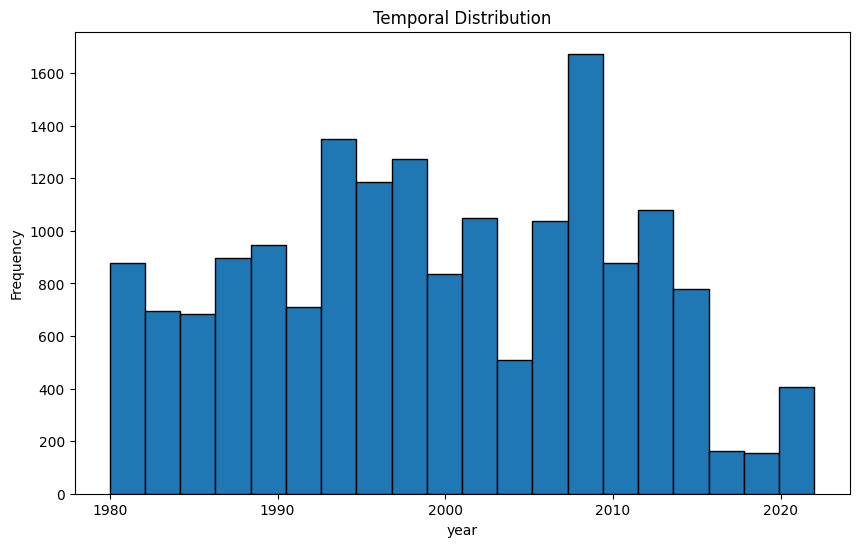

In [ ]:
# Histogram of temporal distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 10 - reproject to polar lambert azimuthal projection (equal area), sample geographically like method 1

In [ ]:
df_sampled = sample_bins_proj(df_ST, n_x_bins=100, n_y_bins=100, projection='nplaea', min_flag=flag)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/1742845558.py:25: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby(['x_bin', 'y_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)


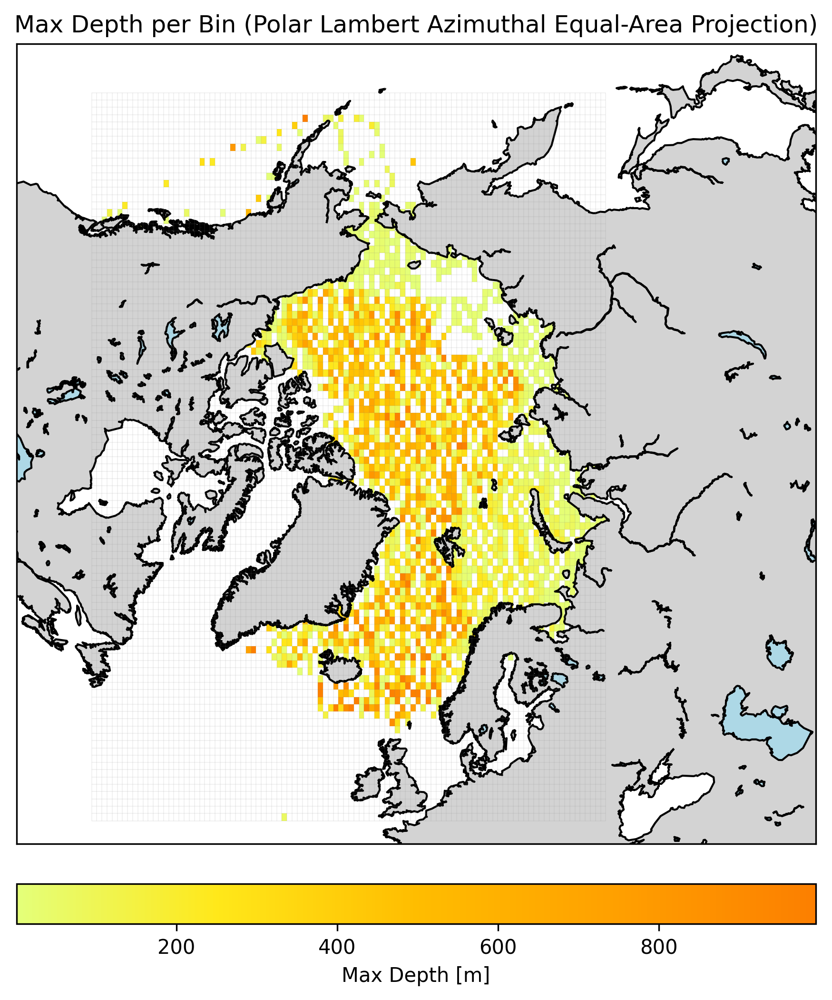

bin max=995.0


In [ ]:
plot_heatmap_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='nplaea', projection_name='Polar Lambert Azimuthal Equal-Area')

In [ ]:
plot_heatmap_npts_xy(df_sampled, n_x_bins=100, n_y_bins=100, projection='nplaea', projection_name='Polar Lambert Azimuthal Equal-Area')

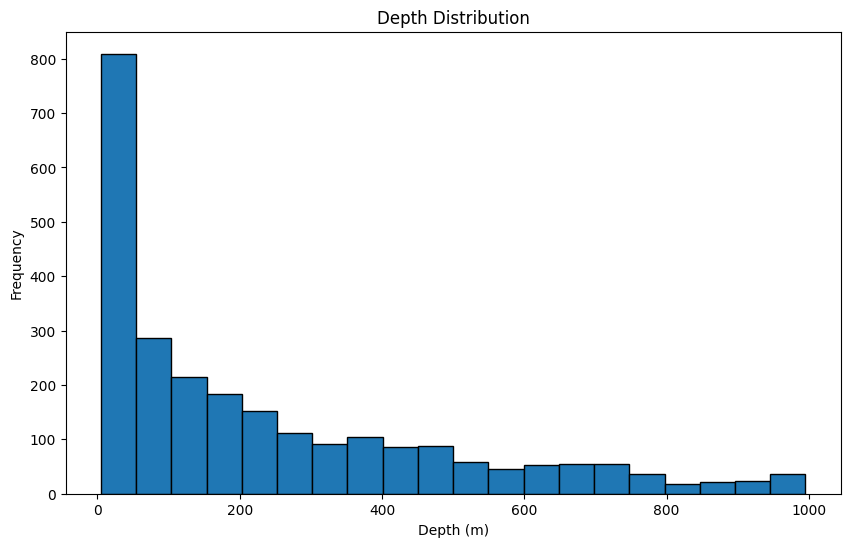

In [ ]:
# Histogram of depth distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

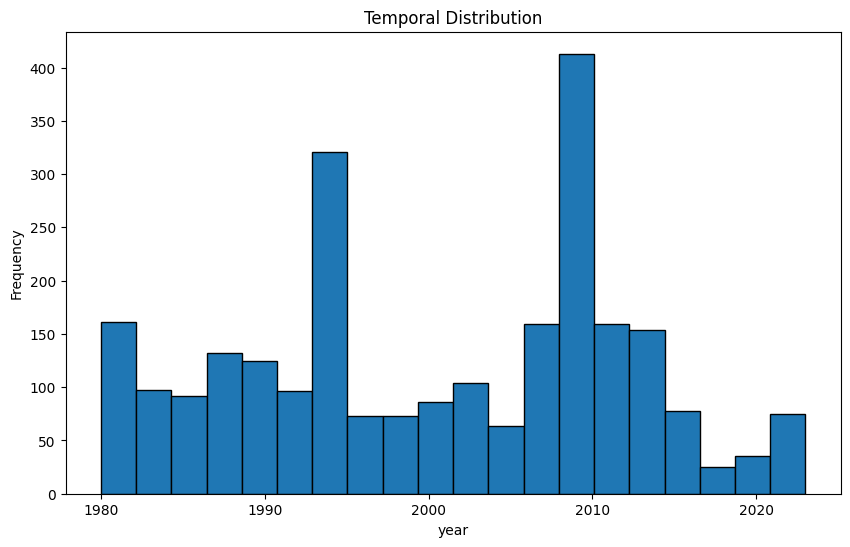

In [ ]:
# Histogram of temporal distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 11 - Reproject to Polar Lambert Azimuthal projection, sample geographically and depth wise for 5 depth layers

In [ ]:
df_sampled = sample_bins_of_bins_proj(df_ST, n_x_bins=100, n_y_bins=100, n_depth_bins=5, projection='nplaea', min_flag=flag)

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:29: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby(['x_bin', 'y_bin', 'depth_bin']).apply(lambda x: x.sample(min_count, random_state=22)).reset_index(drop=True)


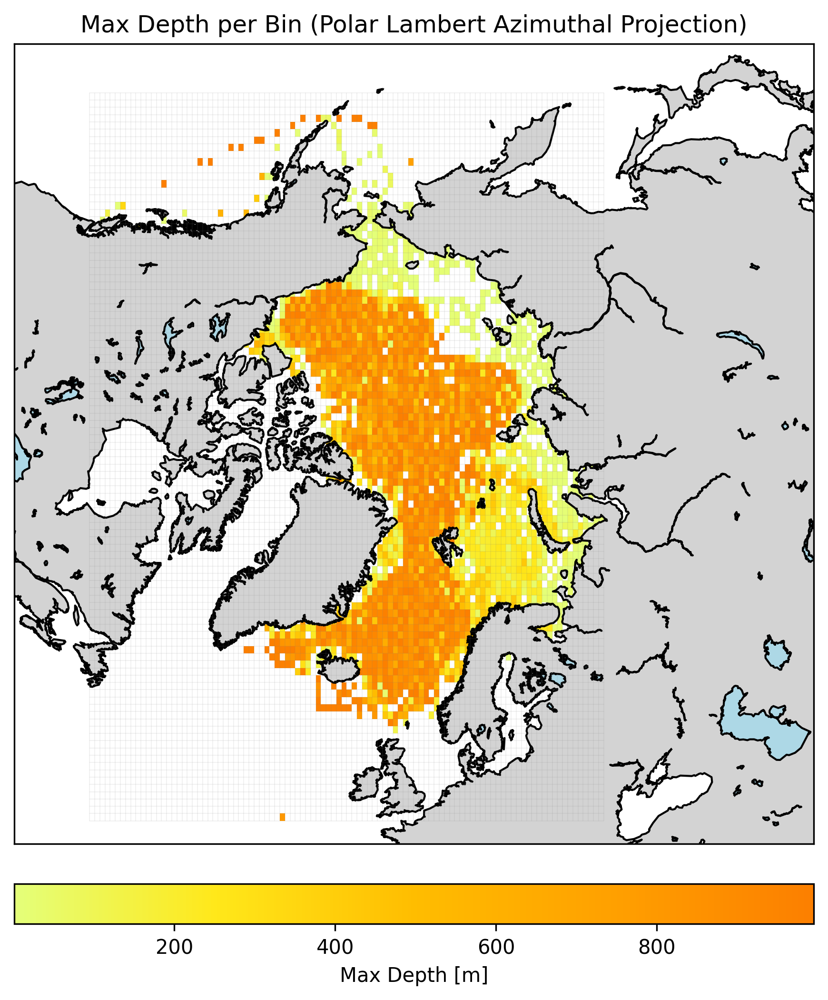

bin max=995.0


In [ ]:
plot_heatmap_xy(df_sampled, projection='nplaea', projection_name='Polar Lambert Azimuthal')

In [ ]:
plot_heatmap_npts_xy(df_sampled, projection='nplaea', projection_name='Polar Lambert Azimuthal Equal-Area')

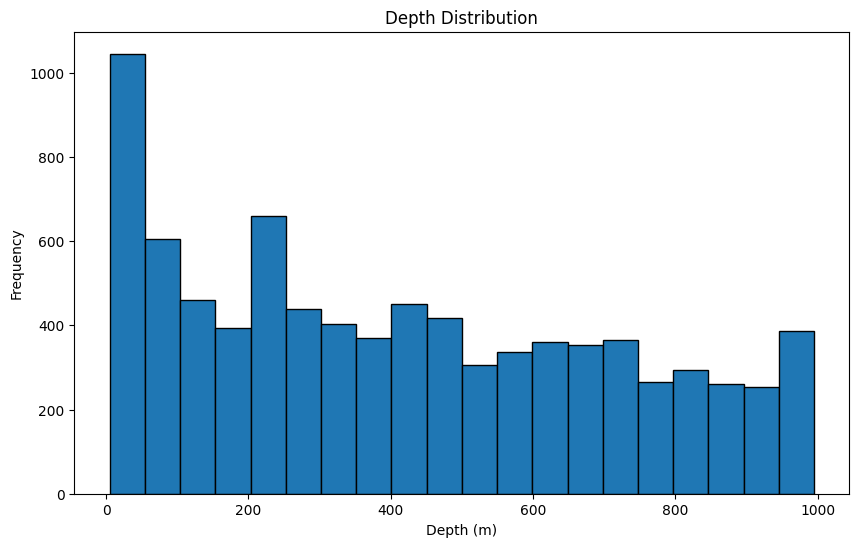

In [ ]:
# Histogram of depth distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

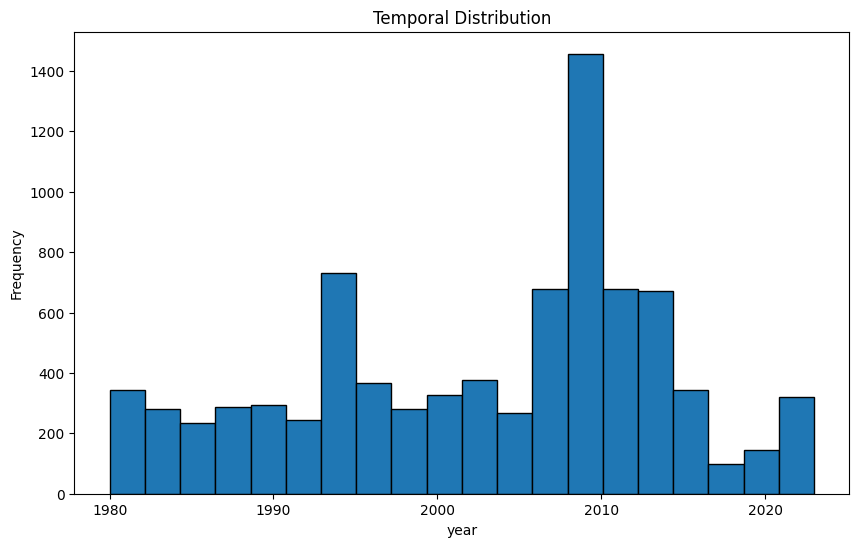

In [ ]:
# Histogram of temporal distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

# Method 12 - Reproject to Polar Lambert Azimuthal Equal-Area Projection, sample geographically and depth wise (5 layers), separate into first and last 20 years

In [ ]:
df_sampled_0 = sample_bins_of_bins_proj(df_80_00, n_x_bins=100, n_y_bins=100, n_depth_bins=5, projection='nplaea', min_flag=flag)
df_sampled_1 = sample_bins_of_bins_proj(df_00_23, n_x_bins=100, n_y_bins=100, n_depth_bins=5, projection='nplaea', min_flag=flag)
df_sampled = pd.concat([df_sampled_0, df_sampled_1], ignore_index=True) 

/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['x_bin'] = pd.cut(x_vals, bins=x_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['y_bin'] = pd.cut(y_vals, bins=y_bins, labels=False, include_lowest=True)
/var/folders/v0/0lp_zzrd33sgh7y2jyh9zzdm0000gn/T/ipykernel_77395/3865529425.py:24: SettingWithCopyWa

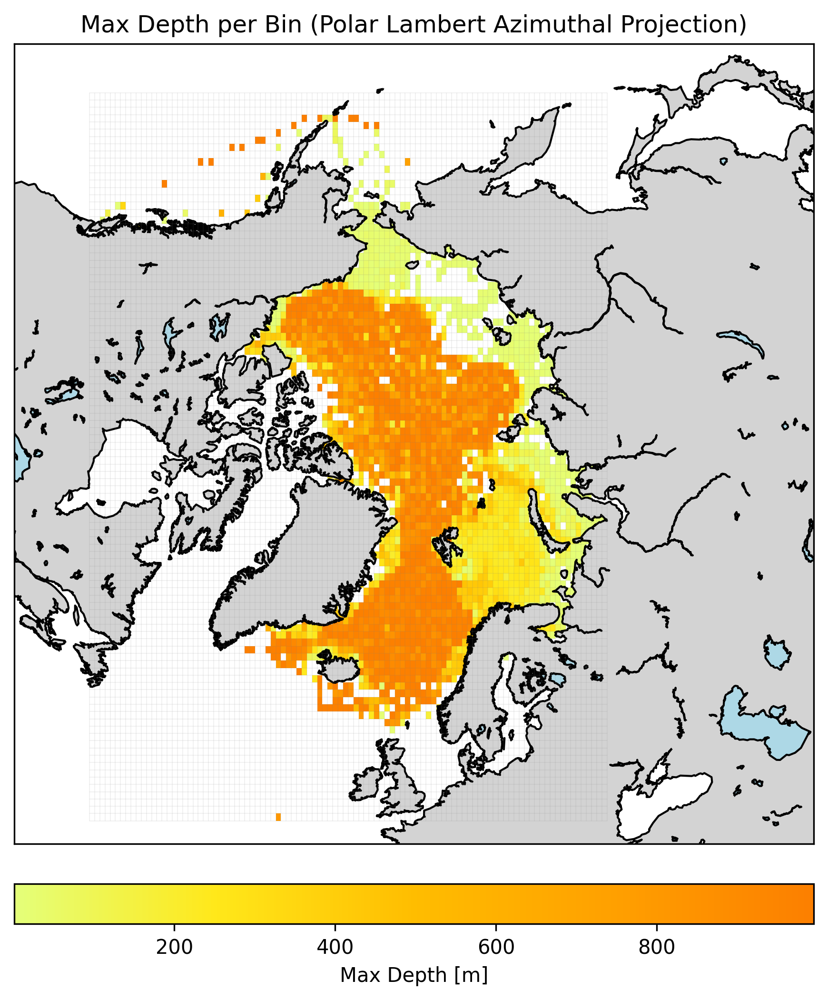

bin max=995.0


In [ ]:
plot_heatmap_xy(df_sampled, projection='nplaea', projection_name='Polar Lambert Azimuthal')

In [ ]:
plot_heatmap_npts_xy(df_sampled, projection='nplaea', projection_name='Polar Lambert Azimuthal Equal-Area')

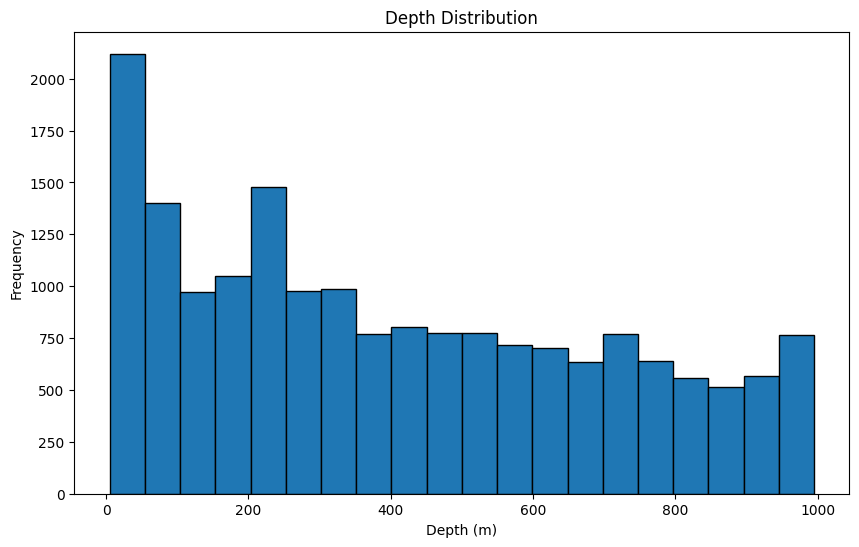

In [ ]:
# Histogram of depth distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['Depth_[m]'], bins=20, edgecolor='black')
plt.title('Depth Distribution')
plt.xlabel('Depth (m)')
plt.ylabel('Frequency')
plt.show()

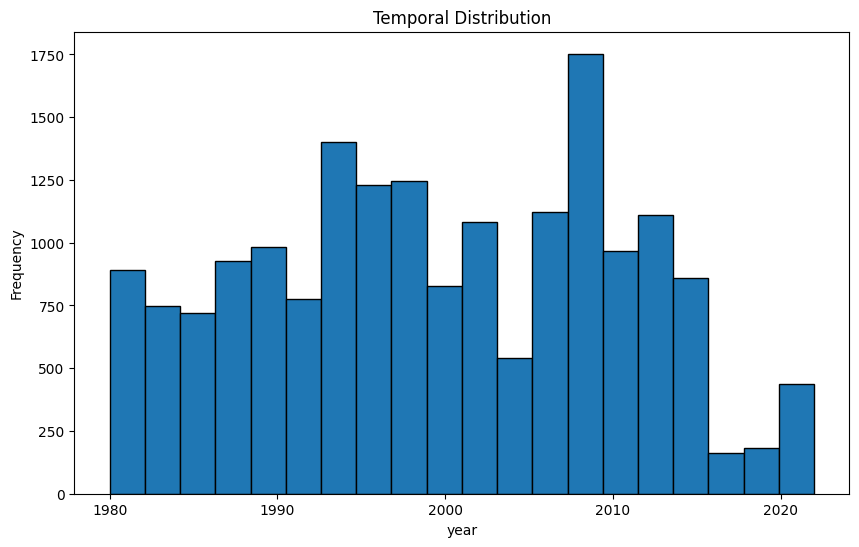

In [ ]:
# Histogram of temporal distribution
plt.figure(figsize=(10, 6))
plt.hist(df_sampled['year'], bins=20, edgecolor='black')
plt.title('Temporal Distribution')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()